# Visualization of the unintegrated object after pre-processing



## Packages and paths

In [75]:
# Core scverse libraries
from __future__ import annotations
import logging

# Main
import anndata as ad 
import scanpy as sc
import pandas as pd
import numpy as np 
import scipy.sparse as sp
import os

# Plotting
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sns

# Scanpy setting: clean white background and high resolution figures
sc.set_figure_params(dpi=300, facecolor="white")
# Set the level of verbosity of scanpy to get more detailed info
sc.settings.verbosity = 3

try:
    SCRIPT_DIR = os.path.dirname(os.path.abspath(__file__))
except NameError:
    SCRIPT_DIR = os.getcwd()  # interactive fallback
PHASE_DIR = os.path.dirname(SCRIPT_DIR)  # 01_preprocessing/
FIG_DIR = os.path.join(PHASE_DIR, "figures", "01_6_visualization")  # figures/01_6_visualization/
os.makedirs(FIG_DIR, exist_ok=True)
sc.settings.figdir = FIG_DIR

# Tell Juptyter to show all outputs and not only the last one
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

!pip list 

Package                 Version       Build
----------------------- ------------- -----
absl-py                 2.5.0
aiohappyeyeballs        2.7.1
aiohttp                 3.14.1
aiosignal               1.4.0
anndata                 0.13.2
anndata2ri              2.0
annotated-types         0.7.0
annoy                   1.17.3
array-api-compat        1.15.0
asttokens               3.0.2
attrs                   26.1.0
backports.zstd          1.6.0
bbknn                   1.6.0
Brotli                  1.2.0
cached-property         1.5.2
celltypist              1.7.1
certifi                 2026.6.17
cffi                    2.1.0
charset-normalizer      3.4.9
click                   8.4.2
comm                    0.2.3
contourpy               1.3.3
cycler                  0.12.1
Cython                  3.2.8
debugpy                 1.8.21
decorator               5.3.1
Deprecated              1.3.1
docrep                  0.3.2
donfig                  0.8.1.post1
drvi-py                 0.2

Setup the directory of the data. This is the path to the cluster data folder (outside the repo) or to the local data folder, like in this case.   
Raw and heavy intermediate objects live here; the repo holds only code.

In [76]:
DATA_DIR = os.environ.get("DATA_DIR", os.path.join(os.path.dirname(PHASE_DIR), "datasets"))

# Input: definitive unintegrated dataset (h5ad format)
INPUT_H5AD = os.path.join(DATA_DIR, "shiao.h5ad")
print("Input :", INPUT_H5AD, "| exists:", os.path.exists(INPUT_H5AD))

Input : /home/albertoc/Desktop/QCB-Master-Thesis/datasets/shiao.h5ad | exists: True


In [77]:
# Load the object
adata = ad.read_h5ad(INPUT_H5AD)
adata

AnnData object with n_obs × n_vars = 619693 × 30869
    obs: 'sample', 'batch', 'cohort', 'treatment', 'fraction', 'dataset_origin', 'response', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_score', 'predicted_doublet', 'is_doublet_shiao', 'high_umi_doublet', 'size_factors', 'S_score', 'G2M_score', 'phase', 'cell_type', 'celltypist_predicted', 'optscib_unintegrated_leiden_0.1', 'optscib_unintegrated_leiden_0.2', 'optscib_unintegrated_leiden_0.3', 'optscib_unintegrated_leiden_0.4', 'optscib_unintegrated_leiden_0.5', 'optscib_unintegrated_leiden_0.6', 'optscib_unintegrated_leiden_0.7', 'optscib_unintegrated_leiden_0.8', 'optscib_unintegrated_leiden_0.9', 'optscib_unintegrated_leiden_1.0', 'optscib_unintegrated_leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts',

## Barplots

### Cell cycle phase distribution

<Axes: xlabel='cohort'>

Text(0.5, 1.0, 'Cell Cycle Phase Distribution by Cohort')

Text(0.5, 0, 'Cohort')

Text(0, 0.5, 'Percentage of Cells')

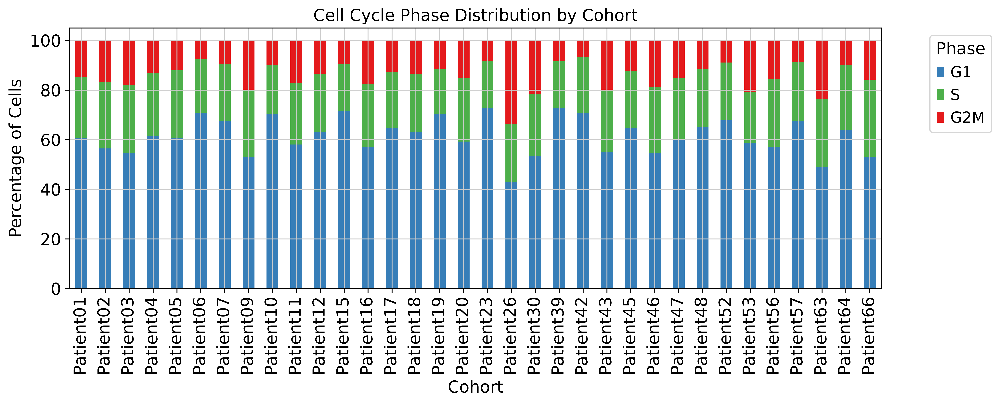

In [78]:
# Fixed phase order/colors (explicit reindex, not positional: crosstab column order is not
# guaranteed to match a hardcoded color list otherwise).
PHASE_ORDER = ["G1", "S", "G2M"]
PHASE_COLORS = {"G1": "#377eb8", "S": "#4daf4a", "G2M": "#e41a1c"}

# Bar plot of cell cycle phase distribution by cohort
tmp = pd.crosstab(adata.obs["cohort"], adata.obs["phase"], normalize="index").reindex(columns=PHASE_ORDER) * 100
tmp.plot.bar(stacked=True, figsize=(12, 5), color=[PHASE_COLORS[p] for p in PHASE_ORDER])
plt.title("Cell Cycle Phase Distribution by Cohort")
plt.xlabel("Cohort")
plt.ylabel("Percentage of Cells")
plt.legend(title="Phase", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "barplot_cc_vs_cohort_unintegrated.png"), dpi=300, bbox_inches="tight")
plt.show()

<Axes: xlabel='cell_type'>

Text(0.5, 1.0, 'Cell Cycle Phase Distribution by Cell Type')

Text(0.5, 0, 'Cell Type')

Text(0, 0.5, 'Percentage of Cells')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]),
 [Text(0, 0, 'Macro-lipo'),
  Text(1, 0, 'CD8-Tem'),
  Text(2, 0, 'CD4-Treg'),
  Text(3, 0, 'Fibro-matrix'),
  Text(4, 0, 'plasma_IgG'),
  Text(5, 0, 'Lumsec-prol'),
  Text(6, 0, 'Macro-IFN'),
  Text(7, 0, 'LummHR-major'),
  Text(8, 0, 'Lumsec-basal'),
  Text(9, 0, 'CD4-naive'),
  Text(10, 0, 'NK-ILCs'),
  Text(11, 0, 'Vas-venous'),
  Text(12, 0, 'CD4-activated'),
  Text(13, 0, 'plasma_IgA'),
  Text(14, 0, 'Mono-classical'),
  Text(15, 0, 'b_naive'),
  Text(16, 0, 'CD4-Th-like'),
  Text(17, 0, 'T_prol'),
  Text(18, 0, 'Fibro-prematrix'),
  Text(19, 0, 'Vas-capillary'),
  Text(20, 0, 'cDC2'),
  Text(21, 0, 'bmem_switched'),
  Text(22, 0, 'NK'),
  Text(23, 0, 'Macro-m2'),
  Text(24, 0, 'pDC'),
  Text(25, 0, 'vsmc'),
  Text(26, 0, 'pericytes'),
  Text(27, 0, 'LummHR-SCGB'),


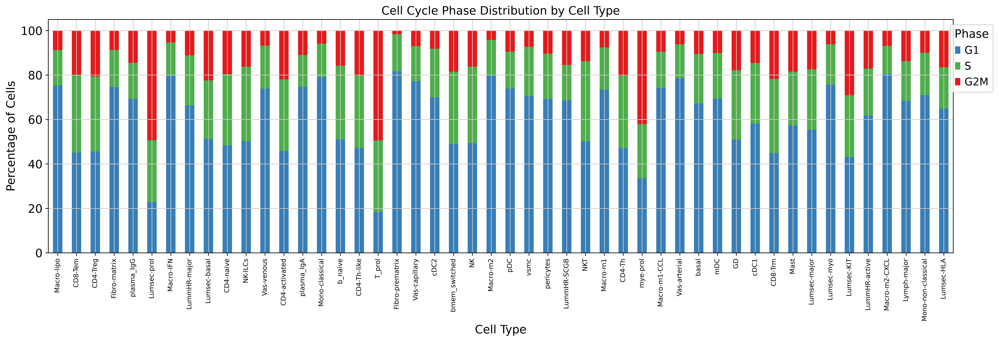

In [79]:
# Bar plot of cell cycle phase distribution by cell type (58 CellTypist labels: wide figure,
# ordered by cell count so the most abundant types are easiest to read).
cell_type_order = adata.obs["cell_type"].value_counts().index
tmp = (
    pd.crosstab(adata.obs["cell_type"], adata.obs["phase"], normalize="index")
    .reindex(index=cell_type_order, columns=PHASE_ORDER) * 100
)
tmp.plot.bar(stacked=True, figsize=(18, 6), color=[PHASE_COLORS[p] for p in PHASE_ORDER])
plt.title("Cell Cycle Phase Distribution by Cell Type")
plt.xlabel("Cell Type")
plt.ylabel("Percentage of Cells")
plt.xticks(rotation=90, fontsize=8)
plt.legend(title="Phase", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "barplot_cc_vs_cell_type_unintegrated.png"), dpi=300, bbox_inches="tight")
plt.show()

### fraction check: cells sorted as immune (CD45+) but annotated a non-immune cell type

`dataset_origin`/`fraction` is the technical CD45 sort (immune = CD45+, non_immune = CD45-);
`cell_type` is the biological CellTypist call (`Cells_Adult_Breast.pkl`, Kumar et al. 2023 breast
atlas, 58 labels). The two are independent, so mismatches are expected at some baseline rate
(ambient RNA, doublets, imperfect sort) -- this checks whether that rate looks reasonable, and
which non-immune types are actually showing up in the CD45+ fraction.

In [80]:
IMMUNE_CELL_TYPES = {
    # T / NK
    "CD4-Tem", "CD4-Th", "CD4-Th-like", "CD4-Treg", "CD4-activated", "CD4-naive",
    "CD8-Tem", "CD8-Trm", "CD8-activated", "GD", "NK", "NK-ILCs", "NKT", "T_prol",
    # Myeloid
    "Macro-IFN", "Macro-lipo", "Macro-m1", "Macro-m1-CCL", "Macro-m2", "Macro-m2-CXCL",
    "Mast", "Mono-classical", "Mono-non-classical", "Neutrophil",
    "cDC1", "cDC2", "mDC", "pDC", "mye-prol",
    # B / Plasma
    "b_naive", "bmem_switched", "bmem_unswitched", "plasma_IgA", "plasma_IgG",
}
NON_IMMUNE_CELL_TYPES = {
    # Epithelial (luminal hormone-responsive / luminal secretory / basal)
    "LummHR-SCGB", "LummHR-active", "LummHR-major",
    "Lumsec-HLA", "Lumsec-KIT", "Lumsec-basal", "Lumsec-lac", "Lumsec-major",
    "Lumsec-myo", "Lumsec-prol", "basal",
    # Stromal / vascular
    "Fibro-SFRP4", "Fibro-major", "Fibro-matrix", "Fibro-prematrix",
    "Lymph-immune", "Lymph-major", "Lymph-valve1", "Lymph-valve2",
    "Vas-arterial", "Vas-capillary", "Vas-venous", "pericytes", "vsmc",
}

observed = set(adata.obs["cell_type"].astype(str).unique())
unclassified = observed - IMMUNE_CELL_TYPES - NON_IMMUNE_CELL_TYPES
if unclassified:
    print(f"WARNING: {len(unclassified)} cell_type value(s) not in either immune/non-immune "
          f"list, excluded from the check below: {sorted(unclassified)}")

adata.obs["is_immune_celltype"] = adata.obs["cell_type"].isin(IMMUNE_CELL_TYPES)

# Full cross-tab: CD45 sort (dataset_origin) vs biological lineage (is_immune_celltype)
sort_vs_lineage = pd.crosstab(
    adata.obs["dataset_origin"], adata.obs["is_immune_celltype"],
    normalize="index",
).rename(columns={True: "pct_immune_celltype", False: "pct_non_immune_celltype"}) * 100
sort_vs_lineage["n_cells"] = adata.obs["dataset_origin"].value_counts()
print(sort_vs_lineage.round(2))

# The specific mismatch asked about: CD45+ (immune) sorted cells with a non-immune cell type
is_immune_sorted = adata.obs["dataset_origin"] == "immune"
is_mismatch = is_immune_sorted & (~adata.obs["is_immune_celltype"])
n_immune_sorted = int(is_immune_sorted.sum())
n_mismatch = int(is_mismatch.sum())
print(f"\nCD45+ (immune) sorted cells annotated as a NON-immune cell type: "
      f"{n_mismatch:,} / {n_immune_sorted:,} ({100 * n_mismatch / n_immune_sorted:.2f}%)")

is_immune_celltype  pct_non_immune_celltype  pct_immune_celltype  n_cells
dataset_origin                                                           
immune                                10.68                89.32   489577
non_immune                            95.56                 4.44   130116

CD45+ (immune) sorted cells annotated as a NON-immune cell type: 52,275 / 489,577 (10.68%)


In [81]:
# Breakdown: which non-immune cell types are actually showing up among the CD45+-sorted cells
mismatch_breakdown = (
    adata.obs.loc[is_mismatch, "cell_type"]
    .value_counts()
)
mismatch_breakdown = mismatch_breakdown[mismatch_breakdown > 0].rename("n_cells").to_frame()
mismatch_breakdown["pct_of_immune_sorted"] = 100 * mismatch_breakdown["n_cells"] / n_immune_sorted
mismatch_breakdown

,n_cells,pct_of_immune_sorted
cell_type,,
Fibro-matrix,11175,2.282583
Lumsec-prol,7868,1.607102
Vas-venous,6864,1.402027
LummHR-SCGB,4348,0.888114
LummHR-major,3174,0.648315
Vas-capillary,3134,0.640144
Fibro-prematrix,2966,0.605829
Lumsec-basal,2774,0.566612
vsmc,2449,0.500228


<Axes: xlabel='dataset_origin'>

Text(0, 0.5, '% of cells')

Text(0.5, 0, 'CD45 sort (dataset_origin)')

Text(0.5, 1.0, 'CellTypist lineage vs CD45 sort')

(array([0, 1]), [Text(0, 0, 'immune'), Text(1, 0, 'non_immune')])

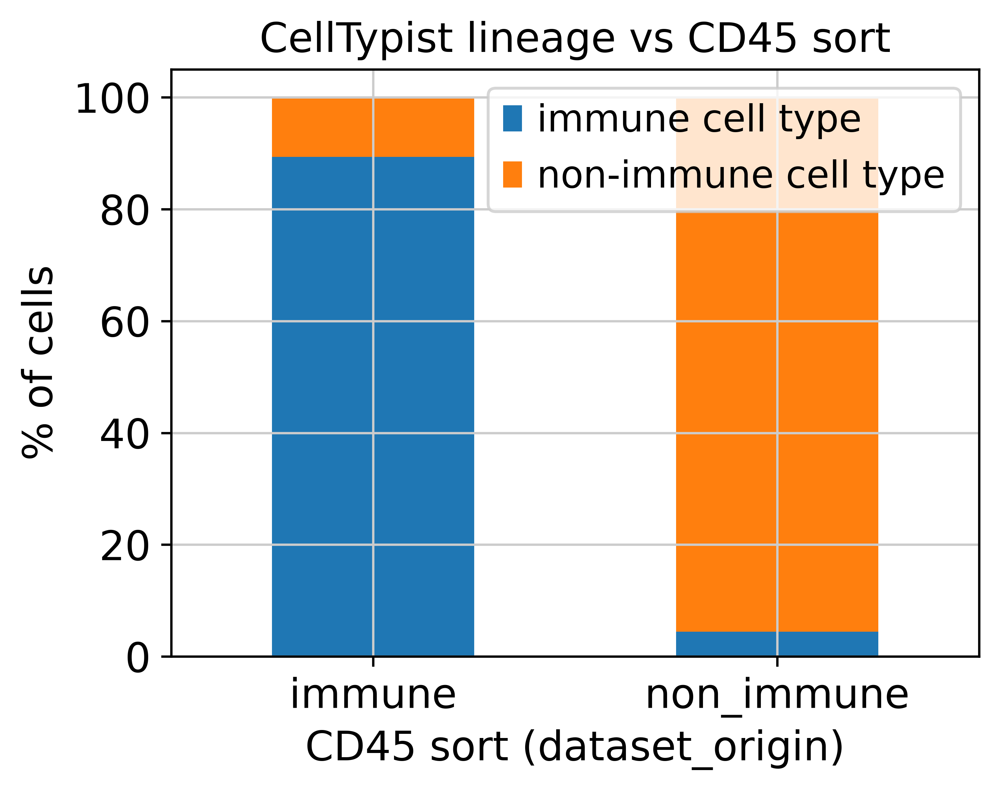

<Axes: ylabel='cell_type'>

Text(0.5, 0, '% of CD45+ (immune) sorted cells')

Text(0.5, 1.0, 'Non-immune cell types found in the CD45+ fraction')

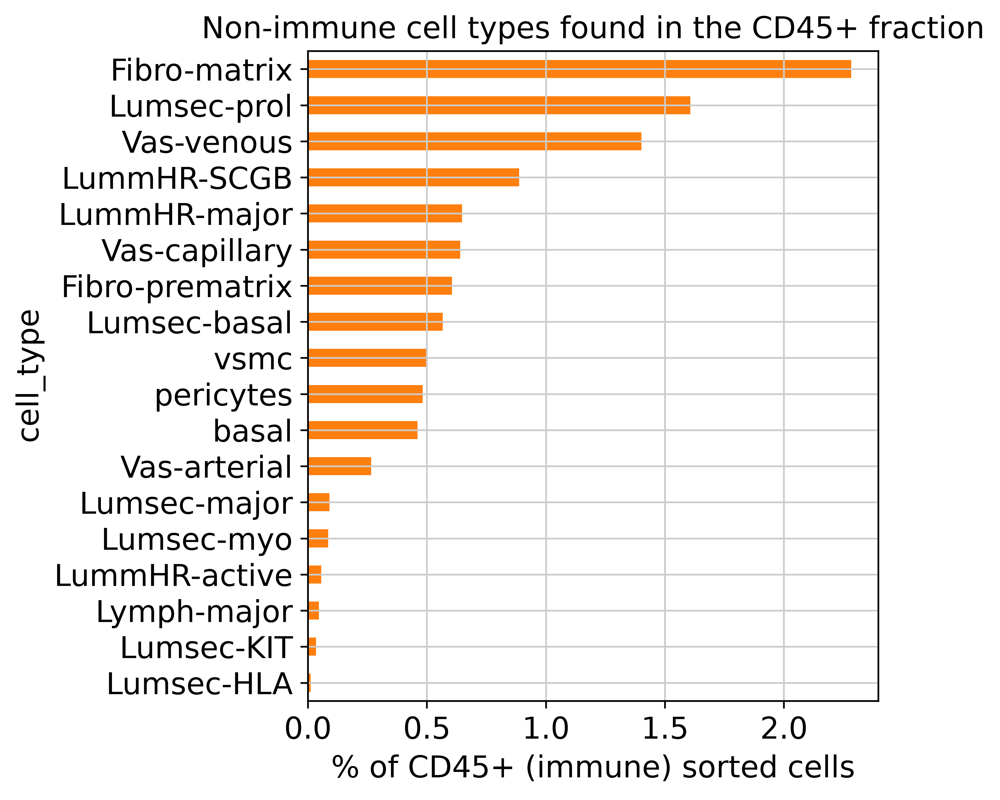

In [82]:
# Plot 1: overall sort purity, immune vs non-immune cell type, per CD45 fraction
fig, ax = plt.subplots(figsize=(5, 4))
plot_df = sort_vs_lineage[["pct_immune_celltype", "pct_non_immune_celltype"]]
plot_df.plot(kind="bar", stacked=True, ax=ax, color=["tab:blue", "tab:orange"])
ax.set_ylabel("% of cells")
ax.set_xlabel("CD45 sort (dataset_origin)")
ax.set_title("CellTypist lineage vs CD45 sort")
ax.legend(title="", labels=["immune cell type", "non-immune cell type"], loc="upper right")
plt.xticks(rotation=0)
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "barplot_sort_purity_by_origin_unintegrated.png"), dpi=300, bbox_inches="tight")
plt.show()

# Plot 2: which non-immune cell types make up the mismatch in the CD45+ fraction
if n_mismatch > 0:
    fig, ax = plt.subplots(figsize=(6, max(3, 0.3 * len(mismatch_breakdown))))
    mismatch_breakdown["pct_of_immune_sorted"].sort_values().plot(kind="barh", ax=ax, color="tab:orange")
    ax.set_xlabel("% of CD45+ (immune) sorted cells")
    ax.set_title("Non-immune cell types found in the CD45+ fraction")
    plt.tight_layout()
    plt.savefig(os.path.join(FIG_DIR, "barh_immune_sort_mismatch_breakdown_unintegrated.png"), dpi=300, bbox_inches="tight")
    plt.show()
else:
    print("No mismatches to plot.")

### Cell counts (cohort, cell type, treatment, response)

Text(0.5, 1.0, 'Number of Cells per Cohort')

Text(0.5, 0, 'Cohort')

Text(0, 0.5, 'Number of Cells')

[Text(0, 0, 'Patient01'),
 Text(1, 0, 'Patient02'),
 Text(2, 0, 'Patient03'),
 Text(3, 0, 'Patient04'),
 Text(4, 0, 'Patient05'),
 Text(5, 0, 'Patient06'),
 Text(6, 0, 'Patient07'),
 Text(7, 0, 'Patient09'),
 Text(8, 0, 'Patient10'),
 Text(9, 0, 'Patient11'),
 Text(10, 0, 'Patient12'),
 Text(11, 0, 'Patient15'),
 Text(12, 0, 'Patient16'),
 Text(13, 0, 'Patient17'),
 Text(14, 0, 'Patient18'),
 Text(15, 0, 'Patient19'),
 Text(16, 0, 'Patient20'),
 Text(17, 0, 'Patient23'),
 Text(18, 0, 'Patient26'),
 Text(19, 0, 'Patient30'),
 Text(20, 0, 'Patient39'),
 Text(21, 0, 'Patient42'),
 Text(22, 0, 'Patient43'),
 Text(23, 0, 'Patient45'),
 Text(24, 0, 'Patient46'),
 Text(25, 0, 'Patient47'),
 Text(26, 0, 'Patient48'),
 Text(27, 0, 'Patient52'),
 Text(28, 0, 'Patient53'),
 Text(29, 0, 'Patient56'),
 Text(30, 0, 'Patient57'),
 Text(31, 0, 'Patient63'),
 Text(32, 0, 'Patient64'),
 Text(33, 0, 'Patient66')]

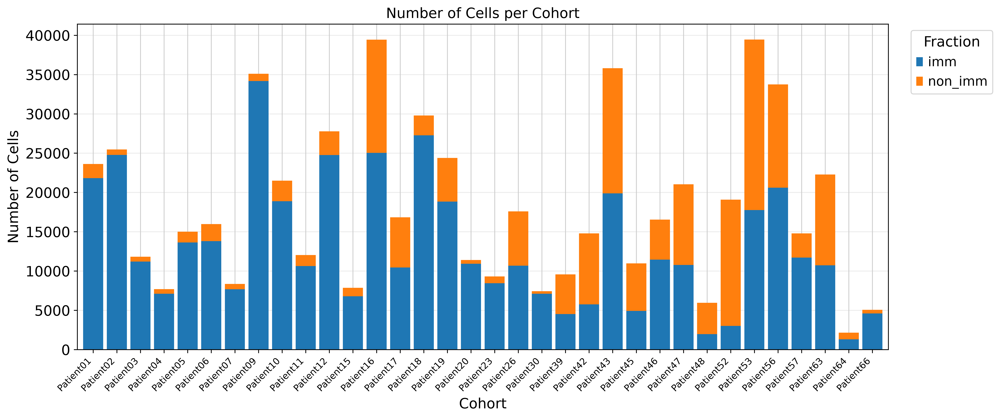

In [83]:
FRACTION_COLORS = {"imm": "tab:blue", "non_imm": "tab:orange"}
fraction_order = [c for c in FRACTION_COLORS if c in adata.obs["fraction"].unique()]

cohort_fraction = pd.crosstab(adata.obs["cohort"], adata.obs["fraction"])[fraction_order]
# Preserve the cohort category order instead of crosstab's alphabetical sort
if adata.obs["cohort"].dtype.name == "category":
    cohort_fraction = cohort_fraction.reindex(adata.obs["cohort"].cat.categories)

ax = cohort_fraction.plot(
    kind="bar", stacked=True, figsize=(14, 6), width=0.85,
    color=[FRACTION_COLORS[c] for c in fraction_order],
)
ax.set_title("Number of Cells per Cohort")
ax.set_xlabel("Cohort")
ax.set_ylabel("Number of Cells")
ax.tick_params(axis="x", rotation=45, labelsize=9)
ax.set_xticklabels(ax.get_xticklabels(), ha="right")
ax.legend(title="Fraction", bbox_to_anchor=(1.02, 1), loc="upper left")
ax.grid(axis="y", linestyle="-", alpha=0.4)
ax.set_axisbelow(True)
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "histogram_cells_per_cohort_unintegrated.png"), dpi=300, bbox_inches="tight")
plt.show()

<Axes: >

<Axes: >

(0.0, 4000.0)

(5000.0, 22777.65)

Text(0, 2, '479')

Text(0, 2, '314')

Text(0, 2, '467')

Text(0.5, 1.0, 'Number of non-immune (non_imm) Cells per Cohort')

Text(0.5, 0, 'Cohort')

[Text(0, 0, 'Patient01'),
 Text(1, 0, 'Patient02'),
 Text(2, 0, 'Patient03'),
 Text(3, 0, 'Patient04'),
 Text(4, 0, 'Patient05'),
 Text(5, 0, 'Patient06'),
 Text(6, 0, 'Patient07'),
 Text(7, 0, 'Patient09'),
 Text(8, 0, 'Patient10'),
 Text(9, 0, 'Patient11'),
 Text(10, 0, 'Patient12'),
 Text(11, 0, 'Patient15'),
 Text(12, 0, 'Patient16'),
 Text(13, 0, 'Patient17'),
 Text(14, 0, 'Patient18'),
 Text(15, 0, 'Patient19'),
 Text(16, 0, 'Patient20'),
 Text(17, 0, 'Patient23'),
 Text(18, 0, 'Patient26'),
 Text(19, 0, 'Patient30'),
 Text(20, 0, 'Patient39'),
 Text(21, 0, 'Patient42'),
 Text(22, 0, 'Patient43'),
 Text(23, 0, 'Patient45'),
 Text(24, 0, 'Patient46'),
 Text(25, 0, 'Patient47'),
 Text(26, 0, 'Patient48'),
 Text(27, 0, 'Patient52'),
 Text(28, 0, 'Patient53'),
 Text(29, 0, 'Patient56'),
 Text(30, 0, 'Patient57'),
 Text(31, 0, 'Patient63'),
 Text(32, 0, 'Patient64'),
 Text(33, 0, 'Patient66')]

Text(0.02, 0.5, 'Number of non_imm Cells')

/tmp/ipykernel_14840/855897252.py:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


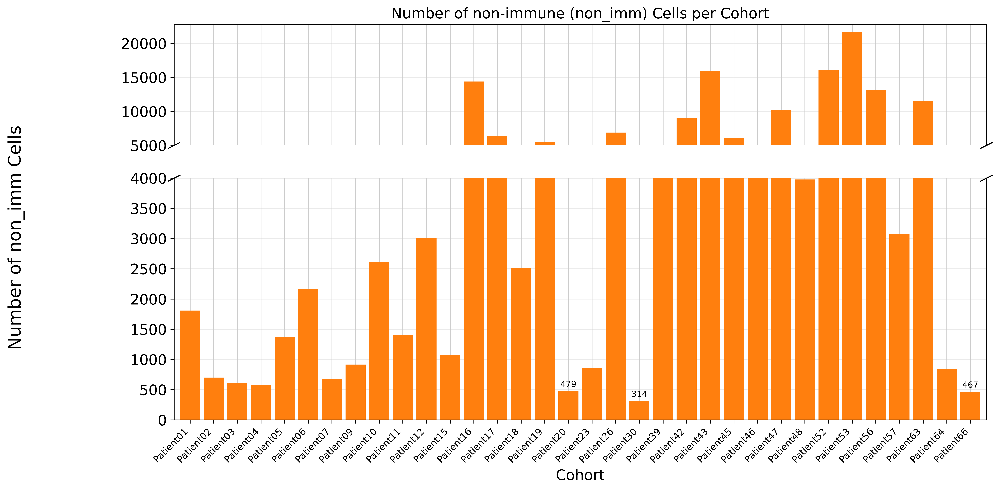

In [84]:
THRESHOLD = 500                    
BREAK_LOW, BREAK_HIGH = 4000, 5000  

non_imm_per_cohort = adata.obs.loc[adata.obs["fraction"] == "non_imm", "cohort"].value_counts()
if adata.obs["cohort"].dtype.name == "category":
    non_imm_per_cohort = non_imm_per_cohort.reindex(adata.obs["cohort"].cat.categories, fill_value=0)
ymax = int(non_imm_per_cohort.max())

fig, (ax_top, ax_bot) = plt.subplots(
    2, 1, sharex=True, figsize=(14, 7),
    gridspec_kw={"height_ratios": [1, 2], "hspace": 0.18},  # gap between the two broken panels
)

# Same bars on both panels; the y-limits select which range each one shows.
for ax in (ax_top, ax_bot):
    non_imm_per_cohort.plot(kind="bar", width=0.85, color="tab:orange", ax=ax, legend=False)
    ax.grid(axis="y", linestyle="-", alpha=0.4)
    ax.set_axisbelow(True)
ax_bot.set_ylim(0, BREAK_LOW)
ax_top.set_ylim(BREAK_HIGH, ymax * 1.05)
# Force a labelled tick exactly at the break, so the top panel visibly starts at BREAK_HIGH
# (otherwise matplotlib's first "round" tick makes it look like it starts higher).
ax_top.set_yticks(sorted({BREAK_HIGH, *range(5000, int(ymax * 1.05) + 1, 5000)}))

# Hide the facing spines and draw the diagonal break marks (matplotlib broken-axis recipe).
ax_top.spines["bottom"].set_visible(False)
ax_bot.spines["top"].set_visible(False)
ax_top.tick_params(axis="x", which="both", bottom=False)
d = 0.5
break_kw = dict(marker=[(-1, -d), (1, d)], markersize=12, linestyle="none",
                color="k", mec="k", mew=1, clip_on=False)
ax_top.plot([0, 1], [0, 0], transform=ax_top.transAxes, **break_kw)
ax_bot.plot([0, 1], [1, 1], transform=ax_bot.transAxes, **break_kw)

# Report the exact count for small bars (< THRESHOLD) above the bar, in the lower panel.
for patch, value in zip(ax_bot.patches, non_imm_per_cohort.values):
    if value < THRESHOLD:
        ax_bot.annotate(f"{int(value)}", (patch.get_x() + patch.get_width() / 2, patch.get_height()),
                        ha="center", va="bottom", fontsize=8, xytext=(0, 2), textcoords="offset points")

ax_top.set_title("Number of non-immune (non_imm) Cells per Cohort")
ax_bot.set_xlabel("Cohort")
ax_bot.tick_params(axis="x", rotation=45, labelsize=9)
ax_bot.set_xticklabels(ax_bot.get_xticklabels(), ha="right")
fig.supylabel("Number of non_imm Cells")
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "histogram_non_imm_cells_per_cohort_unintegrated.png"), dpi=300, bbox_inches="tight")
plt.show()

<BarContainer object of 48 artists>

[Text(0, 0, 'Macro-lipo'),
 Text(1, 0, 'CD8-Tem'),
 Text(2, 0, 'CD4-Treg'),
 Text(3, 0, 'Fibro-matrix'),
 Text(4, 0, 'plasma_IgG'),
 Text(5, 0, 'Lumsec-prol'),
 Text(6, 0, 'Macro-IFN'),
 Text(7, 0, 'LummHR-major'),
 Text(8, 0, 'Lumsec-basal'),
 Text(9, 0, 'CD4-naive'),
 Text(10, 0, 'NK-ILCs'),
 Text(11, 0, 'Vas-venous'),
 Text(12, 0, 'CD4-activated'),
 Text(13, 0, 'plasma_IgA'),
 Text(14, 0, 'Mono-classical'),
 Text(15, 0, 'b_naive'),
 Text(16, 0, 'CD4-Th-like'),
 Text(17, 0, 'T_prol'),
 Text(18, 0, 'Fibro-prematrix'),
 Text(19, 0, 'Vas-capillary'),
 Text(20, 0, 'cDC2'),
 Text(21, 0, 'bmem_switched'),
 Text(22, 0, 'NK'),
 Text(23, 0, 'Macro-m2'),
 Text(24, 0, 'pDC'),
 Text(25, 0, 'vsmc'),
 Text(26, 0, 'pericytes'),
 Text(27, 0, 'LummHR-SCGB'),
 Text(28, 0, 'NKT'),
 Text(29, 0, 'Macro-m1'),
 Text(30, 0, 'CD4-Th'),
 Text(31, 0, 'mye-prol'),
 Text(32, 0, 'Macro-m1-CCL'),
 Text(33, 0, 'Vas-arterial'),
 Text(34, 0, 'basal'),
 Text(35, 0, 'mDC'),
 Text(36, 0, 'GD'),
 Text(37, 0, 'cDC1'),
 Te

Text(0, 3, '14.9%')

Text(0, 3, '10.9%')

Text(0, 3, '8.6%')

Text(0, 3, '7.8%')

Text(0, 3, '4.8%')

Text(0, 3, '4.0%')

Text(0, 3, '3.6%')

Text(0, 3, '3.0%')

Text(0, 3, '2.9%')

Text(0, 3, '2.8%')

Text(0, 3, '2.7%')

Text(0, 3, '2.6%')

Text(0, 3, '2.2%')

Text(0, 3, '2.0%')

Text(0, 3, '1.9%')

Text(0, 3, '1.9%')

Text(0, 3, '1.6%')

Text(0, 3, '1.6%')

Text(0, 3, '1.6%')

Text(0, 3, '1.5%')

Text(0, 3, '1.5%')

Text(0, 3, '1.3%')

Text(0, 3, '1.2%')

Text(0, 3, '1.2%')

Text(0, 3, '1.1%')

Text(0, 3, '1.1%')

Text(0, 3, '1.0%')

Text(0, 3, '1.0%')

Text(0, 3, '0.9%')

Text(0, 3, '0.8%')

Text(0, 3, '0.7%')

Text(0, 3, '0.6%')

Text(0, 3, '0.6%')

Text(0, 3, '0.6%')

Text(0, 3, '0.5%')

Text(0, 3, '0.3%')

Text(0, 3, '0.3%')

Text(0, 3, '0.3%')

Text(0, 3, '0.3%')

Text(0, 3, '0.3%')

Text(0, 3, '0.2%')

Text(0, 3, '0.2%')

Text(0, 3, '0.2%')

Text(0, 3, '0.2%')

Text(0, 3, '0.2%')

Text(0, 3, '0.2%')

Text(0, 3, '0.2%')

Text(0, 3, '0.0%')

Text(0.5, 1.0, 'Number of Cells per Cell Type')

Text(0.5, 0, 'Cell Type')

Text(0, 0.5, 'Number of Cells')

(100, np.int64(276477))

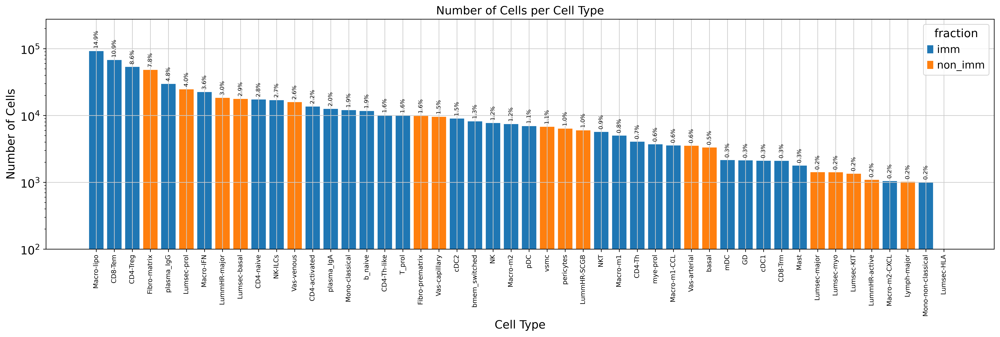

In [85]:
# with % annotations. Each bar is coloured by its FRACTION class using the IMMUNE_CELL_TYPES set
# from the annotation-check section above: imm (immune) = blue, non_imm (non-immune) = orange.
IMM_COLOR, NON_IMM_COLOR = "tab:blue", "tab:orange"

counts = adata.obs["cell_type"].value_counts()  # all observed labels, descending
order = counts.index
colors = [IMM_COLOR if ct in IMMUNE_CELL_TYPES else NON_IMM_COLOR for ct in order]

total = len(adata.obs)
x = np.arange(len(order))  # cell types on the x axis, most abundant leftmost
fig, ax = plt.subplots(figsize=(0.3 * len(order) + 3, 6))
ax.bar(x, counts.values, color=colors)
ax.set_xticks(x)
ax.set_xticklabels(order, fontsize=8, rotation=90)

for xi, val in zip(x, counts.values):
    ax.annotate(f"{100 * val / total:.1f}%", (xi, val), va="bottom", ha="center",
                fontsize=7, rotation=90, xytext=(0, 3), textcoords="offset points")

from matplotlib.patches import Patch
ax.legend(handles=[Patch(color=IMM_COLOR, label="imm"), Patch(color=NON_IMM_COLOR, label="non_imm")],
          title="fraction", loc="upper right")

ax.set_title("Number of Cells per Cell Type")
ax.set_xlabel("Cell Type")
ax.set_ylabel("Number of Cells")
ax.set_yscale('log')
ax.set_ylim(bottom=100, top=counts.max() * 3)  # headroom for the rotated % labels
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "histogram_cells_per_cell_type_unintegrated.png"), dpi=300, bbox_inches="tight")
plt.show()

<Axes: xlabel='treatment'>

Text(0.5, 1.0, 'Number of Cells per Treatment')

Text(0.5, 0, 'Treatment')

Text(0, 0.5, 'Number of Cells')

[Text(0, 0, 'BASE'), Text(1, 0, 'PD1'), Text(2, 0, 'RTPD1')]

<Axes: xlabel='response'>

Text(0.5, 1.0, 'Number of Cells per Response Group')

Text(0.5, 0, 'Response Group')

Text(0, 0.5, 'Number of Cells')

[Text(0, 0, 'NR'), Text(1, 0, 'R1'), Text(2, 0, 'R2')]

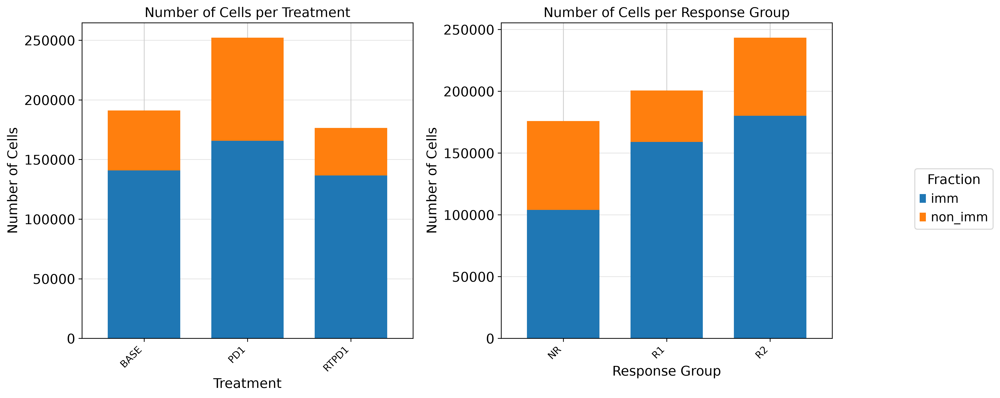

In [86]:
# Number of cells per treatment and per response, each stacked by fraction (imm / non_imm from CellTypist). Fixed 2-color mapping, consistent with the other fraction plots in this notebook.
FRACTION_COLORS = {"imm": "tab:blue", "non_imm": "tab:orange"}
fraction_order = [c for c in FRACTION_COLORS if c in adata.obs["fraction"].unique()]

treatment_fraction = pd.crosstab(adata.obs["treatment"], adata.obs["fraction"])[fraction_order]
response_fraction = pd.crosstab(adata.obs["response"], adata.obs["fraction"])[fraction_order]

fig, axes = plt.subplots(1, 2, figsize=(13, 6), dpi=150)

treatment_fraction.plot(kind="bar", stacked=True, ax=axes[0], width=0.7,
                        color=[FRACTION_COLORS[c] for c in fraction_order], legend=False)
axes[0].set_title("Number of Cells per Treatment")
axes[0].set_xlabel("Treatment")
axes[0].set_ylabel("Number of Cells")
axes[0].tick_params(axis="x", rotation=45, labelsize=10)
axes[0].set_xticklabels(axes[0].get_xticklabels(), ha="right")
axes[0].grid(axis="y", linestyle="-", alpha=0.5)
axes[0].set_axisbelow(True)

response_fraction.plot(kind="bar", stacked=True, ax=axes[1], width=0.7,
                       color=[FRACTION_COLORS[c] for c in fraction_order], legend=False)
axes[1].set_title("Number of Cells per Response Group")
axes[1].set_xlabel("Response Group")
axes[1].set_ylabel("Number of Cells")
axes[1].tick_params(axis="x", rotation=45, labelsize=10)
axes[1].set_xticklabels(axes[1].get_xticklabels(), ha="right")
axes[1].grid(axis="y", linestyle="-", alpha=0.5)
axes[1].set_axisbelow(True)

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, title="Fraction", loc="center right", bbox_to_anchor=(1.12, 0.5))
plt.tight_layout(rect=[0, 0, 0.95, 1])
plt.savefig(os.path.join(FIG_DIR, "histogram_cells_per_treatment_response_unintegrated.png"), dpi=300, bbox_inches="tight")
plt.show()

## Normalization: raw counts vs scran-normalized

`.layers['counts']` = raw integer counts (pre-normalization); `.X` = scran size-factor
normalized **and already log1p-transformed** (see [scran_norm.py](../01_3_normalization/scran_norm.py)).
No extra `log1p` is applied to `.X` below -- it would double-log data that is already in log space.

<Axes: >

Text(0.5, 1.0, 'Library size (raw counts, log1p)')

Text(0, 0.5, 'log1p(total raw counts per cell)')

<Axes: >

Text(0.5, 1.0, 'Sum of log-normalized expression')

Text(0, 0.5, 'Sum of scran log-normalized expression per cell')

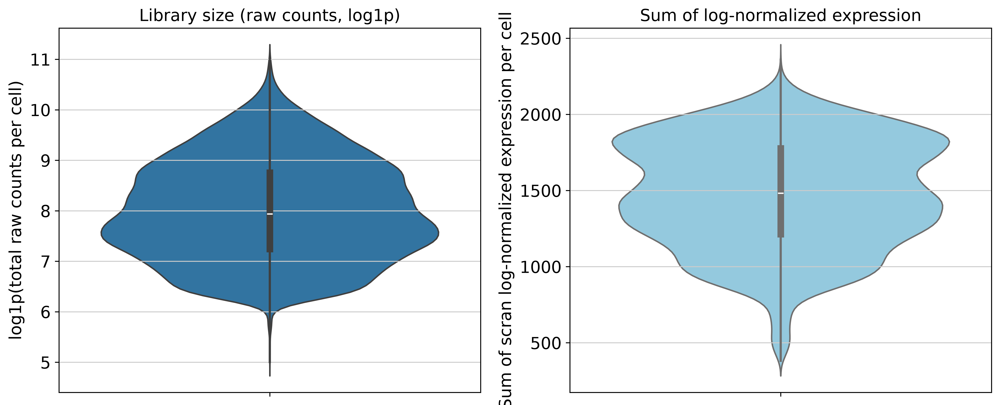

In [87]:
# Violin of per-cell total signal, raw vs scran log-normalized (subsampled for readability/speed).
# the two panels are DIFFERENT units: left is log1p of the raw library size, right is the sum of log-normalized expression. 
# The narrower right violin is a change of units, not an effect of normalization, so the panels are not directly comparable.
sub_adata = sc.pp.subsample(adata, n_obs=min(20000, adata.n_obs), copy=True)

raw_sum = np.asarray(sub_adata.layers["counts"].sum(axis=1)).ravel()
raw_log = np.log1p(raw_sum)  # raw counts are not log-scaled yet -> log1p once here

norm_sum = np.asarray(sub_adata.X.sum(axis=1)).ravel()  # .X is already scran + log1p

fig, ax = plt.subplots(1, 2, figsize=(12, 5))

sns.violinplot(y=raw_log, ax=ax[0])
ax[0].set_title("Library size (raw counts, log1p)")
ax[0].set_ylabel("log1p(total raw counts per cell)")

sns.violinplot(y=norm_sum, ax=ax[1], color="skyblue")
ax[1].set_title("Sum of log-normalized expression")
ax[1].set_ylabel("Sum of scran log-normalized expression per cell")

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "violin_normalization_raw_vs_scran_unintegrated.png"), dpi=300, bbox_inches="tight")
plt.show()

<Axes: xlabel='total_counts', ylabel='Count'>

Text(0.5, 1.0, 'Library size (raw counts)')

Text(0.5, 0, 'Total raw counts per cell (log scale)')

<Axes: ylabel='Count'>

Text(0.5, 1.0, 'Sum of log-normalized expression')

Text(0.5, 0, 'Sum of scran log-normalized expression per cell')

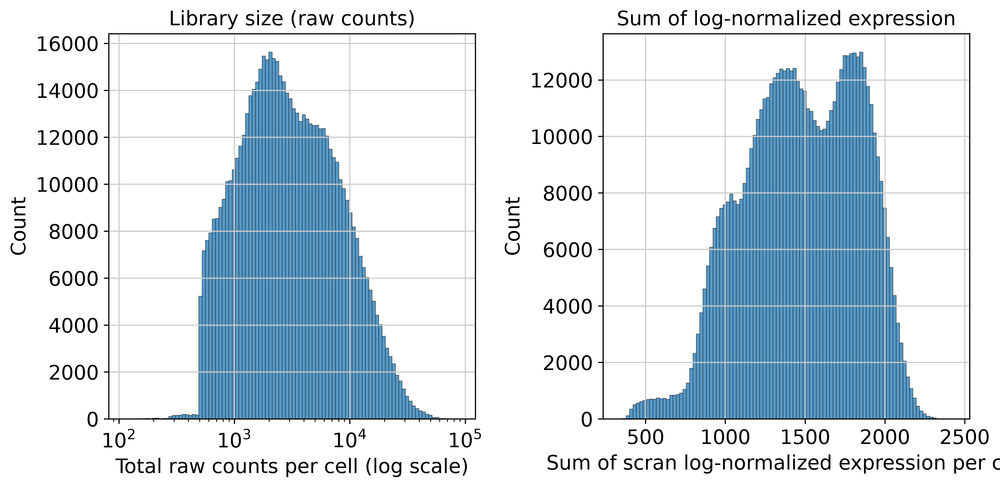

In [88]:
# Per-cell total signal, raw vs scran log-normalized. The two panels are DIFFERENT units, not
# the same metric before/after, left is a sum of raw counts (library size), right is a sum of
# log-normalized values. So they are NOT directly comparable: the smaller spread on the right is a
# change of units, not an effect of normalization. Left uses a log x-axis (library size is heavy-tailed).
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

sns.histplot(adata.obs["total_counts"], bins=100, kde=False, log_scale=True, ax=axes[0])
axes[0].set_title("Library size (raw counts)")
axes[0].set_xlabel("Total raw counts per cell (log scale)")

sns.histplot(np.asarray(adata.X.sum(axis=1)).ravel(), bins=100, kde=False, ax=axes[1])
axes[1].set_title("Sum of log-normalized expression")
axes[1].set_xlabel("Sum of scran log-normalized expression per cell")

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "histogram_total_counts_raw_vs_normalized_unintegrated.png"), dpi=300, bbox_inches="tight")
plt.show()

### Size factors (scran)

/tmp/ipykernel_14840/1513488074.py:2: FutureWarning: Argument `save` is deprecated and will be removed in a future version. Use `sc.pl.plot(show=False).figure.savefig()` instead.
  sc.pl.scatter(adata, "size_factors", "total_counts", color="cell_type",


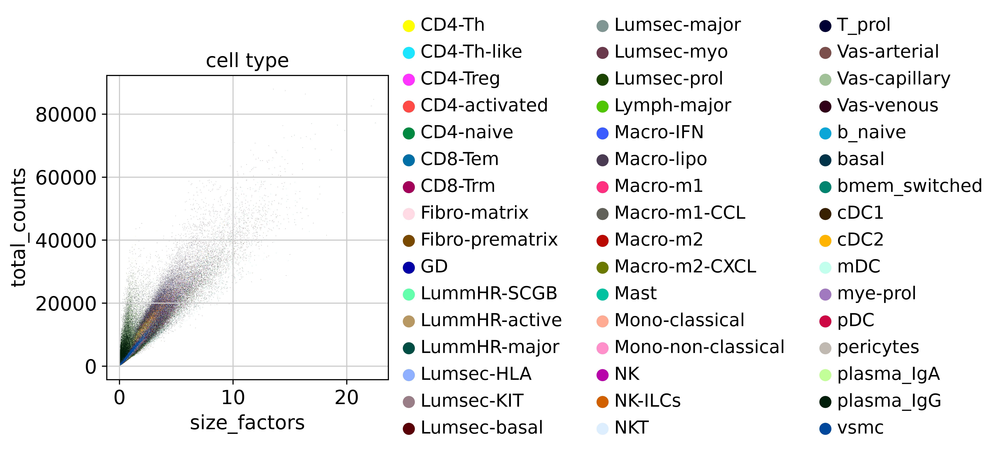

/tmp/ipykernel_14840/1513488074.py:4: FutureWarning: Argument `save` is deprecated and will be removed in a future version. Use `sc.pl.plot(show=False).figure.savefig()` instead.
  sc.pl.scatter(adata, "size_factors", "total_counts", color="fraction",


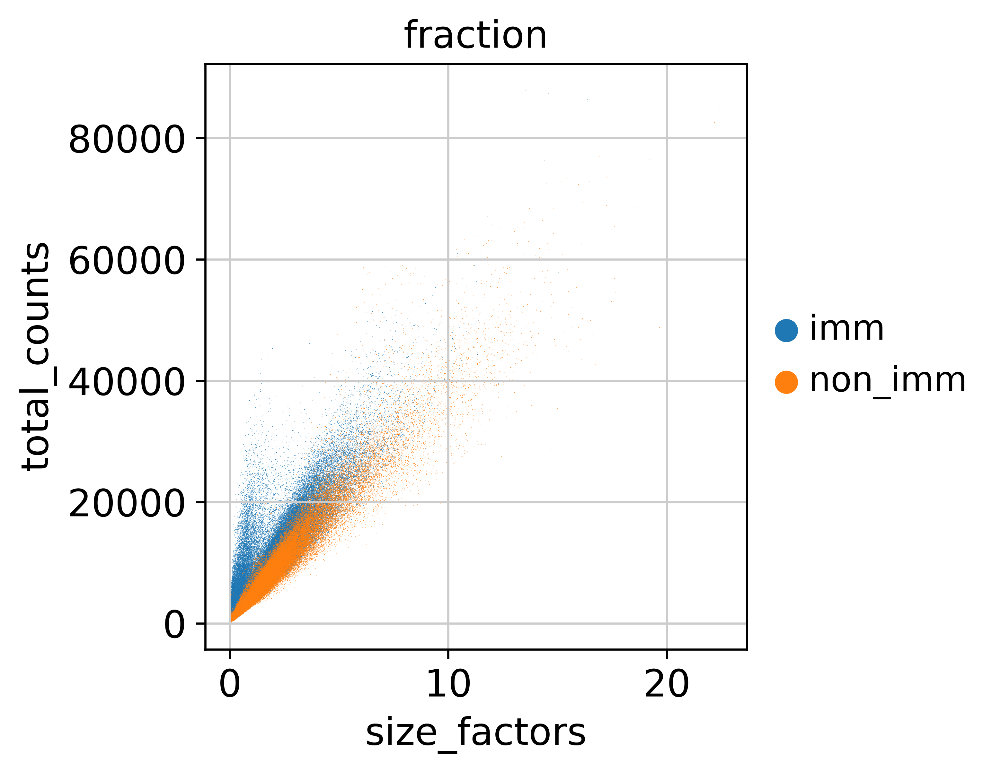

/tmp/ipykernel_14840/1513488074.py:6: FutureWarning: Argument `save` is deprecated and will be removed in a future version. Use `sc.pl.plot(show=False).figure.savefig()` instead.
  sc.pl.scatter(adata, "size_factors", "n_genes_by_counts", color="cell_type",


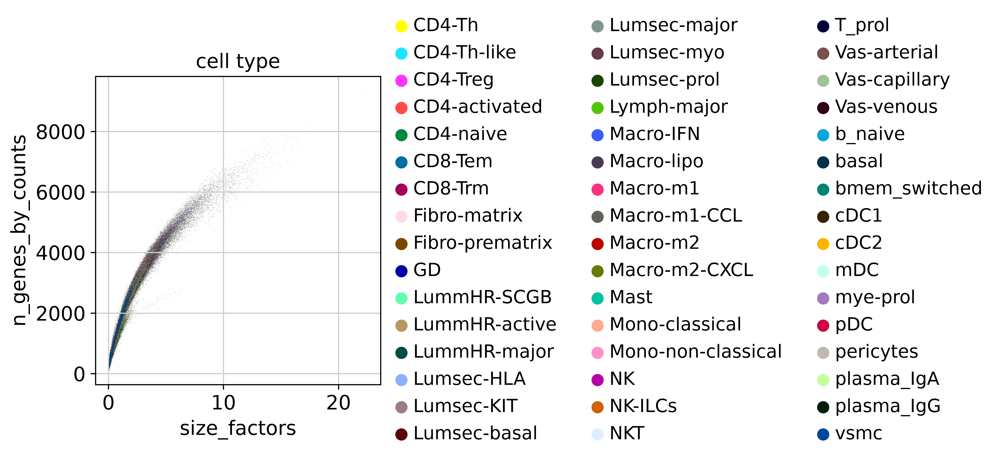

/tmp/ipykernel_14840/1513488074.py:8: FutureWarning: Argument `save` is deprecated and will be removed in a future version. Use `sc.pl.plot(show=False).figure.savefig()` instead.
  sc.pl.scatter(adata, "size_factors", "n_genes_by_counts", color="fraction",


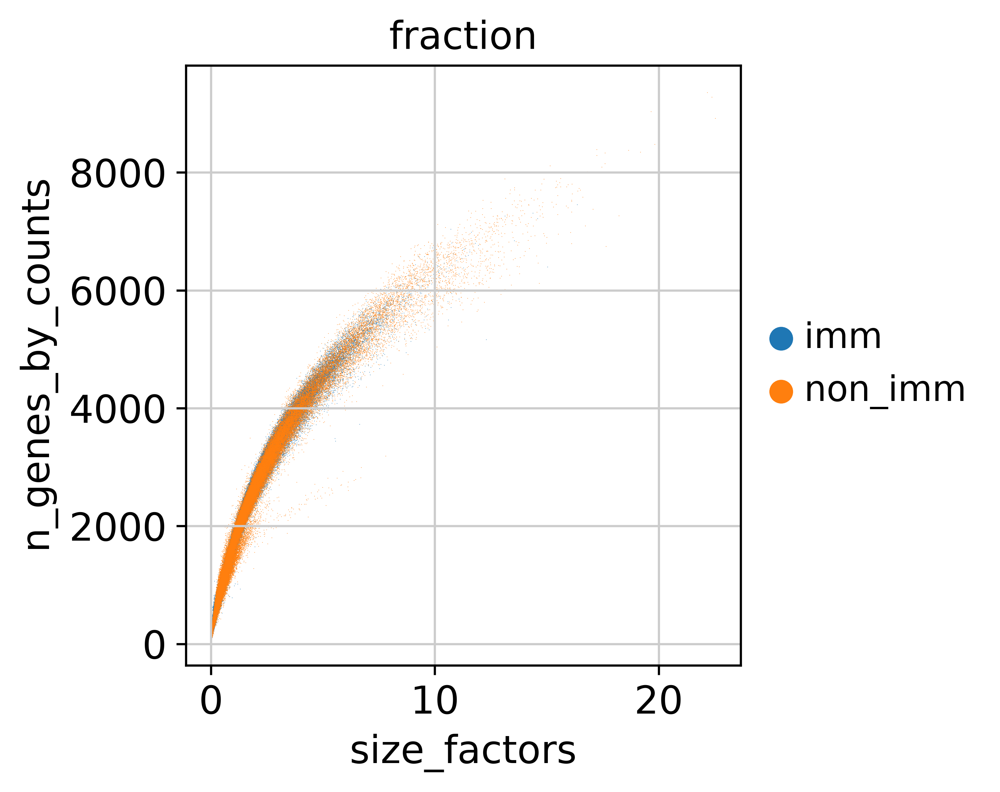

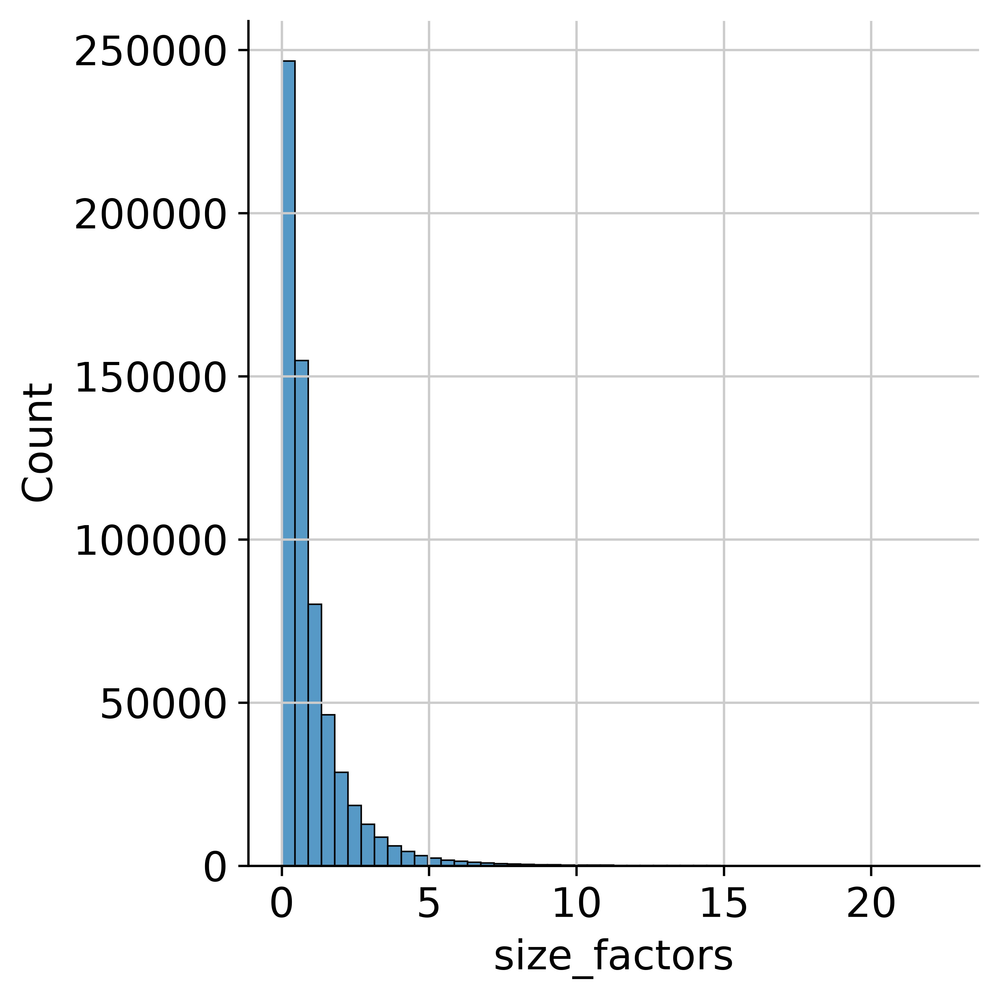

In [89]:
# Size factors vs library size / n_genes_by_counts, colored by cell_type / fraction
sc.pl.scatter(adata, "size_factors", "total_counts", color="cell_type",
              save="_size_factors_vs_total_counts_by_cell_type_unintegrated.png")
sc.pl.scatter(adata, "size_factors", "total_counts", color="fraction",
              save="_size_factors_vs_total_counts_by_fraction_unintegrated.png")
sc.pl.scatter(adata, "size_factors", "n_genes_by_counts", color="cell_type",
              save="_size_factors_vs_n_genes_by_counts_by_cell_type_unintegrated.png")
sc.pl.scatter(adata, "size_factors", "n_genes_by_counts", color="fraction",
              save="_size_factors_vs_n_genes_by_counts_by_fraction_unintegrated.png")

# Distribution of size factors
sns.displot(adata.obs["size_factors"], bins=50, kde=False)
plt.savefig(os.path.join(FIG_DIR, "displot_size_factors_unintegrated.png"), dpi=300, bbox_inches="tight")
plt.show()

## UMAPs


### General QC / metadata UMAPs

In [ ]:
UMAP_QC_KEYS = {
    "cell_type": "cell_type",
    "fraction": "fraction",
    "n_genes_by_counts": "n_genes_by_counts",
    "total_counts": "total_counts",
    "mito": "pct_counts_mt",
    "ribo": "pct_counts_ribo",
    "cohort": "cohort",
    "treatment": "treatment",
    "response": "response",
    "phase": "phase",
    # scran size factors on the embedding: the scatters above show they track library size,
    # this shows whether that gradient is also a spatial one (a cluster of systematically
    # low/high size factors is a depth effect, not a cell state). Same panel as in 03_1.
    "size_factors": "size_factors",
}

UMAP_SEED = 0

_order = np.random.default_rng(UMAP_SEED).permutation(adata.n_obs)
adata_plot = ad.AnnData(
    obs=adata.obs.iloc[_order].copy(),
    obsm={"X_umap": adata.obsm["X_umap"][_order]},
    uns={k: v for k, v in adata.uns.items() if k.endswith("_colors")},
)

for label, col in UMAP_QC_KEYS.items():
    sc.pl.umap(adata_plot, color=col, save=f"_{label}_unintegrated.png")


In [ ]:
# The metadata panels in one grid, for the thesis figure: annotation + experimental design
# only, the QC/continuous panels stay as individual UMAPs above. Same layout as the 03_1
# combined UMAP, which drops `fraction` (that subset is non_imm by construction).
# Larger panels + a wide wspace on purpose: with 58 CellTypist labels the cell_type legend
# needs three columns, and at the default panel size it runs over the next panel.
UMAP_COMBINED_KEYS = ["cell_type", "fraction", "cohort", "treatment", "response", "phase"]

with plt.rc_context({"figure.figsize": (7, 7)}):
    sc.pl.umap(
        adata_plot,
        color=UMAP_COMBINED_KEYS,
        ncols=2,
        wspace=0.8,
        hspace=0.25,
        save="_combined_qc_unintegrated.png",
    )

### Leiden clustering across resolutions (0.1-1.0), vs CellTypist cell_type

10 resolutions were swept in [scib_clustering.py](../01_5_scib_pp/scib_clustering.py) (columns
`optscib_unintegrated_leiden_<res>`). Split into two 6-panel grids (5 resolutions + `cell_type`
as a reference each) instead of one dense 10-panel figure.

In [ ]:
# The resolution/NMI profile behind the selected clustering, same plot as 03_1.
# scib_clustering.py discards the return value of cluster_optimal_resolution, so the sweep is
# not stored in the object: it is recomputed here from the per-resolution columns kept in
# .obs, with the same criterion scib maximizes (NMI vs cell_type, arithmetic averaging).
from sklearn.metrics import normalized_mutual_info_score

CLUSTER_KEY = "optscib_unintegrated_leiden"
cluster_cols = sorted(
    (c for c in adata.obs.columns if c.startswith(f"{CLUSTER_KEY}_") and c != CLUSTER_KEY),
    key=lambda c: float(c.rsplit("_", 1)[1]),
)
prof = pd.DataFrame({
    "resolution": [float(c.rsplit("_", 1)[1]) for c in cluster_cols],
    "score": [normalized_mutual_info_score(adata.obs["cell_type"], adata.obs[c])
              for c in cluster_cols],
})

best = prof.loc[prof["score"].idxmax()]
fig, ax = plt.subplots(figsize=(7, 4))
ax.plot(prof["resolution"], prof["score"], marker="o", ms=4)
ax.axvline(best["resolution"], color="tab:red", ls="--", lw=1)
ax.annotate(f"optimum: res={best['resolution']:g}, NMI={best['score']:.3f}",
            (best["resolution"], best["score"]), xytext=(6, -12),
            textcoords="offset points", fontsize=9, color="tab:red")
ax.set_xlabel("Leiden resolution")
ax.set_ylabel("NMI vs cell_type")
ax.set_title("Optimal-resolution sweep (unintegrated, imm + non_imm)")
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "leiden_resolution_profile_unintegrated.png"), dpi=300, bbox_inches="tight")
plt.show()

# Sanity check: the resolution kept as the selected clustering should be the argmax above.
n_sel = adata.obs[CLUSTER_KEY].nunique()
matching = [c for c in cluster_cols if adata.obs[c].astype(str).equals(adata.obs[CLUSTER_KEY].astype(str))]
print(f"selected clustering: {n_sel} clusters | identical per-resolution column(s): {matching}")
prof

In [ ]:
# Resolutions 0.1-0.5 + cell_type (6 panels). Leiden clusters get labels drawn on the UMAP;
resolutions_1_5 = [0.1, 0.2, 0.3, 0.4, 0.5]
cluster_cols_1 = [f"optscib_unintegrated_leiden_{r}" for r in resolutions_1_5] + ["cell_type"]

fig, axes = plt.subplots(2, 3, figsize=(18, 11))
for col, ax in zip(cluster_cols_1, axes.flat):
    sc.pl.umap(adata_plot, color=col, ax=ax, show=False, title=col,
               legend_loc="none" if col == "cell_type" else "on data")
fig.savefig(os.path.join(FIG_DIR, "umap_unintegrated_leiden_resolutions_1-5.png"), dpi=300, bbox_inches="tight")
plt.show()

In [ ]:
# Resolutions 0.6-1.0 + cell_type (6 panels). Leiden clusters get labels drawn on the UMAP;
resolutions_6_10 = [0.6, 0.7, 0.8, 0.9, 1.0]
cluster_cols_2 = [f"optscib_unintegrated_leiden_{r}" for r in resolutions_6_10] + ["cell_type"]

fig, axes = plt.subplots(2, 3, figsize=(18, 11))
for col, ax in zip(cluster_cols_2, axes.flat):
    sc.pl.umap(adata_plot, color=col, ax=ax, show=False, title=col,
               legend_loc="none" if col == "cell_type" else "on data")
fig.savefig(os.path.join(FIG_DIR, "umap_unintegrated_leiden_resolutions_6-10.png"), dpi=300, bbox_inches="tight")
plt.show()